In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as stats
import statsmodels.api as sm

In [3]:
df = pd.read_csv('main(out).csv')

In [4]:
pd.set_option('display.max_columns', None)
df.head()

,ID,ADDRESS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,DAYS_BIRTH_CLEAN,Letter,STATUS,MONTHS_BALANCE
0,5008804,"06042, CT, 31 Mitchell Road",M,Y,Y,0,225000.0,Working,Higher education,Civil marriage,Rented apartment,4542.0,1,1,0,0,Laborers,2,1990-09-04,L,0,1
1,5008804,"06042, CT, 31 Mitchell Road",M,Y,Y,0,225000.0,Working,Higher education,Civil marriage,Rented apartment,4542.0,1,1,0,0,Laborers,2,1990-09-04,L,1,1
2,5008804,"06042, CT, 31 Mitchell Road",M,Y,Y,0,225000.0,Working,Higher education,Civil marriage,Rented apartment,4542.0,1,1,0,0,Laborers,2,1990-09-04,L,C,13
3,5008804,"06042, CT, 31 Mitchell Road",M,Y,Y,0,225000.0,Working,Higher education,Civil marriage,Rented apartment,4542.0,1,1,0,0,Laborers,2,1990-09-04,L,X,1
4,5008804,"06042, CT, 31 Mitchell Road",F,N,Y,1,90000.0,State servant,Secondary / secondary special,Married,House / apartment,3659.0,1,0,0,0,Medicine staff,3,1984-07-06,L,0,1


# Diccionario de datos
* ID: Identificación única por póliza, no por persona
* Address: Dirección, incluyendo su estado en USA
* Code_Gender: Género de la persona. M = Masculino, F = Femenino
* Flag...: Si tiene o no el objeto que se describe. Y = Si, N = No
* Cnt_Children: Número de hijos
* Amt_Income_Total: Sueldo anual
* Name_Income_Type: De dónde proviene ese sueldo
* Name_Family_Status: Estado civil
* Name_Housing_Type: Tipo de hogar en el que vive esa persona
* Days_Employed: Días cotizados
* Occupation_Type: Tipo de trabajo
* Cnt_Fam_Members: Número de miembros en la familia
* Days_Birth_Clean: Fecha de nacimiento
* Letter: Letra identificativa, normalmente usada junto al ID
* Status: Estado de la póliza. C = Completa, X = Sin datos / Cancelada, 1..2..5.. = Número de meses en deuda
* Months_Balance: Número de meses que lleva la póliza activa, en nuestro dataframe actual tenemos el número de meses que la cuenta ha tenido cada estado.

# Análisis

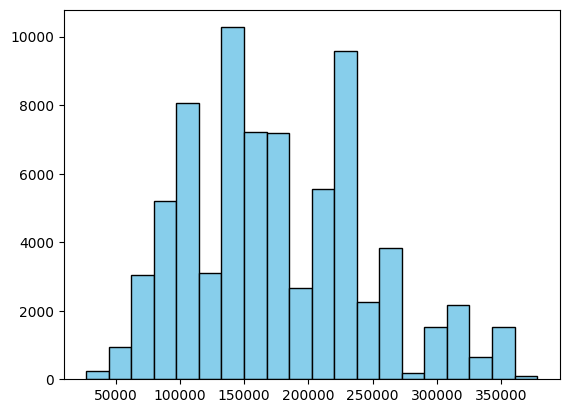

In [89]:
plt.hist(df['AMT_INCOME_TOTAL'], bins=20, color='skyblue', edgecolor='black');

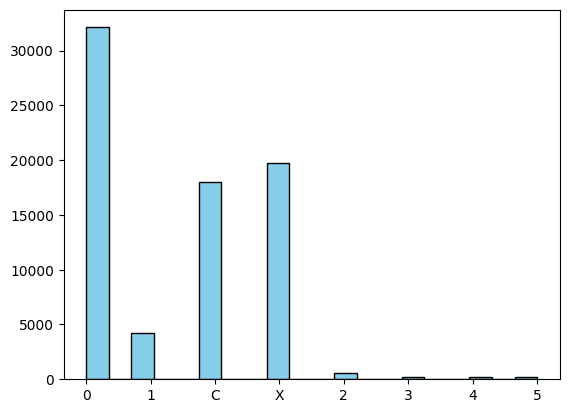

In [90]:
plt.hist(df['STATUS'], bins=20, color='skyblue', edgecolor='black');

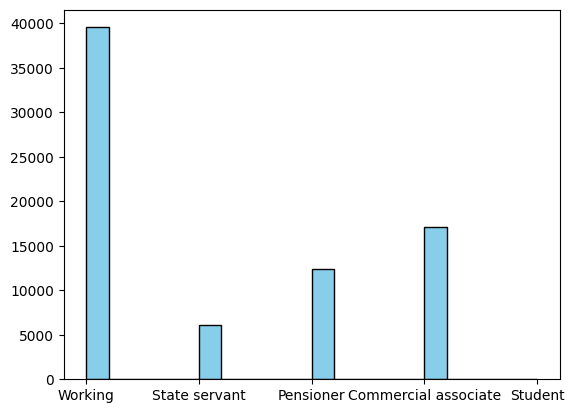

In [99]:
plt.hist(df['NAME_INCOME_TYPE'], bins=20, color='skyblue', edgecolor='black');

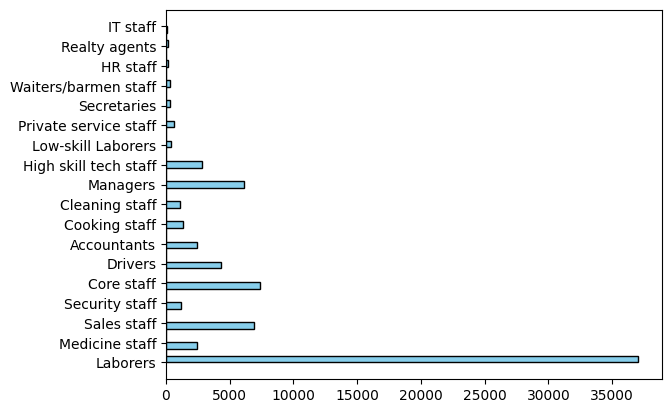

In [97]:
plt.hist(df['OCCUPATION_TYPE'], bins=50, color='skyblue', edgecolor='black', orientation="horizontal");

## ¿Con qué podríamos relacionar la variable Status?

### Sueldo anual:

In [76]:
fig = px.histogram(df, y='AMT_INCOME_TOTAL', x='STATUS', color='STATUS', title='Sueldo total según el estado de la póliza', histfunc="avg"
                   , labels={'AMT_INCOME_TOTAL':'Sueldo total', 'STATUS':'Estado de la póliza'})
fig.show()

#### Vemos que el estado de la cuenta no depende directamente del sueldo anual

### De dónde proviene el sueldo

In [77]:
fig = px.histogram(df, x='STATUS', color='NAME_INCOME_TYPE', title='Tipo de ingreso según estado', histfunc="count"
                   , barmode='group', log_y=False, labels={'STATUS':'Estado de la póliza', 'NAME_INCOME_TYPE':'Tipo de ingreso'})
fig.show()

#### Para una mejor visualización, dividimos en dos las gráficas

In [78]:
fig.update_xaxes(range=[-0.5, 3.5])
fig.show()

In [79]:
fig.update_xaxes(range=[3.5, 7.5])
fig.update_yaxes(range=[0, 500])
fig.show()

In [11]:
stat, p = stats.kendalltau(df["STATUS"], df["NAME_INCOME_TYPE"])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
	print('Probablemente independientes')
else:
	print('Probablemente dependientes')

stat=-0.004, p=0.209
Probablemente independientes


In [12]:
from scipy.stats import chi2_contingency
contingency_table = pd.crosstab(df["STATUS"], df["NAME_INCOME_TYPE"])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print('stat=%.3f, p=%.3f' % (chi2, p))
if p > 0.05:
	print('Probablemente independientes')
else:
	print('Probablemente dependientes')

stat=84.442, p=0.000
Probablemente dependientes


#### Tras aplicar el test de chi2, vemos que el pvalue es exactamente 0, así que comprobamos la tabla de contingencia para asegurarnos de que las suposiciones de este test se cumplen

In [13]:
contingency_table

NAME_INCOME_TYPE,Commercial associate,Pensioner,State servant,Student,Working
STATUS,,,,,
0,7241,5276,2583,11,17016
1,1037,593,374,1,2175
2,124,120,32,0,279
3,63,67,16,0,102
4,54,39,8,0,80
5,48,37,11,0,84
C,4092,2994,1453,9,9501
X,4499,3297,1614,8,10324


#### Como en la tabla vemos que hay muchos valores con muy baja frecuencia (por debajo de 5), decidimos utilizar otro tipo de test para comprobar si la variable influye realmente en el estado de la póliza

In [14]:
from statsmodels.stats.contingency_tables import cochrans_q
print(cochrans_q(contingency_table))

df          4
pvalue      0.40600584970983794
statistic   4.0


### Tipo de trabajo

In [15]:
df.columns

Index(['ID', 'ADDRESS', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'DAYS_EMPLOYED', 'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'DAYS_BIRTH_CLEAN',
       'Letter', 'STATUS', 'MONTHS_BALANCE'],
      dtype='object')

In [81]:
fig = px.histogram(df, x='STATUS', color='OCCUPATION_TYPE', title='Tipo de ocupación según estado de la póliza'
                   , histfunc="count", barmode='group', log_y=False
                   , labels={'STATUS':'Estado de la póliza', 'OCCUPATION_TYPE':'Tipo de ocupación'})
fig.show()

#### Ejecutamos el mismo procedimiento que con la anterior variable

In [82]:
fig.update_xaxes(range=[-0.5, 3.5])
fig.update_yaxes(range=[0, 5000])
fig.show()

In [83]:
fig.update_xaxes(range=[3.5, 7.5])
fig.update_yaxes(range=[0, 200])
fig.show()

In [19]:
stat, p = stats.kendalltau(df["STATUS"], df["OCCUPATION_TYPE"])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
	print('Probablemente independientes')
else:
	print('Probablemente dependientes')

stat=-0.005, p=0.089
Probablemente independientes


In [20]:
from statsmodels.stats.contingency_tables import cochrans_q
contingency_table = pd.crosstab(df["STATUS"], df["OCCUPATION_TYPE"])
print(cochrans_q(contingency_table))

df          17
pvalue      0.4543661137906364
statistic   17.0


### Nº de miembros en la familia

In [84]:
fig = px.histogram(df, x='STATUS', color='CNT_FAM_MEMBERS', title='Cantidad de miembros de la familia según estado de la póliza'
                   , histfunc="count", barmode='group', log_y=False
                   , labels={'STATUS':'Estado de la póliza', 'CNT_FAM_MEMBERS':'Cantidad de miembros de la familia'})
fig.show()

In [22]:
stat, p = stats.kendalltau(df["STATUS"], df["CNT_FAM_MEMBERS"])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
	print('Probablemente independientes')
else:
	print('Probablemente dependientes')

stat=-0.001, p=0.700
Probablemente independientes


In [26]:
contingency_table = pd.crosstab(df["STATUS"], df["CNT_FAM_MEMBERS"])
contingency_table

CNT_FAM_MEMBERS,1,2,3,4,5,6,7,9,15,20
STATUS,,,,,,,,,,
0,6022,17514,5464,2707,354,46,14,2,3,1
1,777,2263,679,404,48,5,0,2,2,0
2,126,290,88,38,12,1,0,0,0,0
3,60,136,32,15,4,1,0,0,0,0
4,44,96,26,13,1,1,0,0,0,0
5,35,102,31,10,1,1,0,0,0,0
C,3332,9990,2991,1506,195,27,6,2,0,0
X,3637,10895,3377,1583,202,31,16,0,1,0


In [27]:
from statsmodels.stats.contingency_tables import cochrans_q
contingency_table = pd.crosstab(df["STATUS"], df["OCCUPATION_TYPE"])
print(cochrans_q(contingency_table))

df          17
pvalue      0.4543661137906364
statistic   17.0


## Estudiamos la variable AMT_INCOME_TOTAL

### Comprobamos si sigue una distribución normal

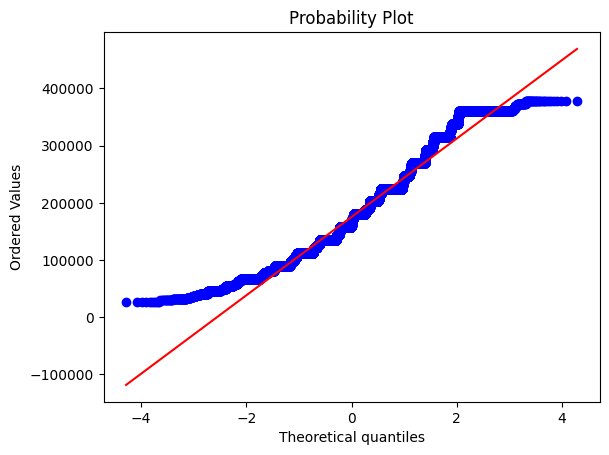

In [62]:
fig = plt.figure()
res = stats.probplot(df['AMT_INCOME_TOTAL'], plot=plt)
plt.show()

### Comparamos la variable con el género y los días cotizados

In [85]:
fig = px.histogram(df, x='CODE_GENDER', y='AMT_INCOME_TOTAL', title='Sueldo total según género'
                   , color="CODE_GENDER",histfunc="avg"
                   , labels={'AMT_INCOME_TOTAL':'Sueldo total', "CODE_GENDER":"Género"})
fig.show()

In [86]:
px.scatter(df, y="DAYS_EMPLOYED", x="AMT_INCOME_TOTAL", title='Sueldo total by días de empleo'
           , labels={'AMT_INCOME_TOTAL':'Sueldo total', 'DAYS_EMPLOYED':'Días de empleo'})

#### Al ver el scatter plot, se hace raro que haya tantos resultados con 6733 días

In [43]:
df['DAYS_EMPLOYED'].value_counts()

DAYS_EMPLOYED
6733.0    14240
401.0       152
200.0       132
1539.0      126
2531.0      125
          ...  
7864.0        1
7142.0        1
871.0         1
5287.0        1
8953.0        1
Name: count, Length: 3655, dtype: int64

In [45]:
6733 / 365

18.446575342465753

In [59]:
df[df["DAYS_EMPLOYED"] == 6733]

,ID,ADDRESS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,DAYS_BIRTH_CLEAN,Letter,STATUS,MONTHS_BALANCE
19,5008806,"72701, AR, 218 Shipley Alley",F,N,N,0,49500.0,Pensioner,Secondary / secondary special,Married,House / apartment,6733.0,1,0,0,0,Laborers,2,1966-06-19,D,0,7
20,5008806,"72701, AR, 218 Shipley Alley",F,N,N,0,49500.0,Pensioner,Secondary / secondary special,Married,House / apartment,6733.0,1,0,0,0,Laborers,2,1966-06-19,D,C,7
21,5008806,"72701, AR, 218 Shipley Alley",F,N,N,0,49500.0,Pensioner,Secondary / secondary special,Married,House / apartment,6733.0,1,0,0,0,Laborers,2,1966-06-19,D,X,16
31,5008810,"32404, FL, 7041 Coe Road",F,N,Y,0,360000.0,Pensioner,Secondary / secondary special,Married,House / apartment,6733.0,1,0,0,0,Laborers,2,1959-11-30,C,0,6
32,5008810,"32404, FL, 7041 Coe Road",F,N,Y,0,360000.0,Pensioner,Secondary / secondary special,Married,House / apartment,6733.0,1,0,0,0,Laborers,2,1959-11-30,C,C,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75168,5145817,"94703, CA, 2704 McGee Avenue",F,N,Y,0,90000.0,Pensioner,Secondary / secondary special,Married,House / apartment,6733.0,1,0,0,0,Laborers,2,1962-11-16,P,X,28
75185,5148602,"2515 60th Avenue, 94605, CA",M,N,Y,0,225000.0,Pensioner,Secondary / secondary special,Married,House / apartment,6733.0,1,0,0,0,Laborers,2,1960-04-25,L,0,11
75186,5148602,"2515 60th Avenue, 94605, CA",M,N,Y,0,225000.0,Pensioner,Secondary / secondary special,Married,House / apartment,6733.0,1,0,0,0,Laborers,2,1960-04-25,L,2,1
75187,5148602,"2515 60th Avenue, 94605, CA",M,N,Y,0,225000.0,Pensioner,Secondary / secondary special,Married,House / apartment,6733.0,1,0,0,0,Laborers,2,1960-04-25,L,3,1


##### Viendo la muestra anterior, comprobamos si todos son Pensioner

In [66]:
df[df["DAYS_EMPLOYED"] == 6733]["NAME_INCOME_TYPE"].value_counts()

NAME_INCOME_TYPE
Pensioner               12354
Working                  1289
Commercial associate      441
State servant             156
Name: count, dtype: int64

In [68]:
df[df["NAME_INCOME_TYPE"] == "Pensioner"]["DAYS_EMPLOYED"].value_counts()

DAYS_EMPLOYED
6733.0    12354
586.0         7
1325.0        7
678.0         6
1644.0        6
2269.0        6
620.0         5
2208.0        4
3680.0        4
443.0         4
2745.0        4
5521.0        4
913.0         3
673.0         3
7553.0        3
198.0         3
Name: count, dtype: int64

In [72]:
# Calculamos el porcentaje de pensionistas que tienen 6733 días de empleo
(df["DAYS_EMPLOYED"].loc[(df["NAME_INCOME_TYPE"] == "Pensioner") & (df["DAYS_EMPLOYED"] == 6733.0)].value_counts().sum() / df[df["NAME_INCOME_TYPE"] == "Pensioner"]["DAYS_EMPLOYED"].value_counts().sum()) * 100

99.44457860420188

##### Con las dos celdas anteriores de código podemos observar que 6733 parece ser un valor estándar para la mayoría de pensionistas, ese número equivale a unos 18 años de trabajo. Lo más probable es que sea un valor por defecto que la aseguradora usa para los pensionistas, ya que el 99.4% de pensionistas poseen este número de días cotizados

### Estudiamos la relación entre el sueldo total y el nivel de estudios

In [87]:
px.histogram(df, x='NAME_EDUCATION_TYPE', y='AMT_INCOME_TOTAL', title='Sueldo total según nivel de educación'
             , color="NAME_EDUCATION_TYPE",histfunc="avg"
             , labels={'AMT_INCOME_TOTAL':'Sueldo total', "NAME_EDUCATION_TYPE":"Nivel de educación"})

## Conclusiones dataset

### El conjunto de datos no parece tener muchas variables que se relacionen matemáticamente entre sí, por lo que será difícil predecir resultados. En base a las gráficas vistas nuestra variable objetivo será STATUS, ya que parece indicar el estado de la póliza actual (anterior en el caso de nuevos clientes) del cliente